In [ ]:
!pip install --upgrade pip
!pip install ultralytics
!pip install opencv-python-headless
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install git+https://github.com/cocodataset/panopticapi.git
!pip install onnx onnxruntime
!pip install matplotlib scikit-learn seaborn

!git clone https://github.com/ultralytics/ultralytics.git
%cd ultralytics
!pip install -e .



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 30.5 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 28.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 156.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 143.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 63.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 63.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 66.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5

In [ ]:
import os
import zipfile

!wget -O oil_spill_dataset.zip "https://mklab.iti.gr/files/oil-spill-detection-dataset.zip"
!unzip -q oil_spill_dataset.zip -d /content/oil-spill-dataset

!ls /content/oil-spill-dataset


--2025-04-06 21:08:41--  https://mklab.iti.gr/files/oil-spill-detection-dataset.zip
Resolving mklab.iti.gr (mklab.iti.gr)... 160.40.50.223
Connecting to mklab.iti.gr (mklab.iti.gr)|160.40.50.223|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 402398051 (384M) [application/zip]
Saving to: ‘oil_spill_dataset.zip’

oil_spill_dataset.z 100%[===================>] 383.76M  11.1MB/s    in 36s     

2025-04-06 21:09:18 (10.6 MB/s) - ‘oil_spill_dataset.zip’ saved [402398051/402398051]

replace /content/oil-spill-dataset/Oil Spill Detection Dataset/README.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: 'Oil Spill Detection Dataset'


In [ ]:
import os

base_path = "/content/oil-spill-dataset/Oil Spill Detection Dataset"

image_dir = os.path.join(base_path, "train", "images")
mask_dir = os.path.join(base_path, "train", "labels_1D")  # use "labels" for RGB version if needed

if os.path.exists(image_dir) and os.path.exists(mask_dir):
    print("Total images:", len(os.listdir(image_dir)))
    print("Total masks:", len(os.listdir(mask_dir)))
else:
    print("One or both folders not found.")
    print("image_dir:", image_dir)
    print("mask_dir:", mask_dir)


✅ Total images: 1002
✅ Total masks: 1002


In [ ]:
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import numpy as np

IMAGE_SIZE = (256, 256)

class OilSpillDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_filenames = sorted(os.listdir(image_dir))
        self.mask_filenames = sorted(os.listdir(mask_dir))
        self.transform = transform

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        # Load and preprocess image
        image_path = os.path.join(self.image_dir, self.image_filenames[idx])
        image = Image.open(image_path).convert("RGB")
        image = image.resize(IMAGE_SIZE)
        image = np.array(image) / 255.0  # Normalize to [0,1]
        image = torch.tensor(image, dtype=torch.float).permute(2, 0, 1)  # [C, H, W]

        # Load and preprocess mask
        mask_path = os.path.join(self.mask_dir, self.mask_filenames[idx])
        mask = Image.open(mask_path)
        mask = mask.resize(IMAGE_SIZE, resample=Image.NEAREST)
        mask = np.array(mask, dtype=np.uint8)
        mask = torch.tensor(mask, dtype=torch.long)  # [H, W] with class labels

        return image, mask


In [ ]:
from torch.utils.data import DataLoader, random_split

train_image_dir = "/content/oil-spill-dataset/Oil Spill Detection Dataset/train/images"
train_mask_dir = "/content/oil-spill-dataset/Oil Spill Detection Dataset/train/labels_1D"

test_image_dir = "/content/oil-spill-dataset/Oil Spill Detection Dataset/test/images"
test_mask_dir = "/content/oil-spill-dataset/Oil Spill Detection Dataset/test/labels_1D"

train_dataset = OilSpillDataset(train_image_dir, train_mask_dir)
test_dataset = OilSpillDataset(test_image_dir, test_mask_dir)

# Optionally split training set for validation
train_size = int(0.9 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

BATCH_SIZE = 8  # Tune based on memory

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print("✅ DataLoaders ready.")


✅ DataLoaders ready.


In [ ]:
import torchvision
from torchvision.models.segmentation import deeplabv3_resnet101
import torch.nn as nn

model = deeplabv3_resnet101(pretrained=True)

model.classifier[4] = nn.Conv2d(256, 5, kernel_size=1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

print("✅ DeepLabV3+ model ready and moved to", device)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ DeepLabV3+ model ready and moved to cuda


In [ ]:
import torch.nn.functional as F
import torch.optim as optim

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

print("✅ Loss, Optimizer, and Scheduler are set up.")


✅ Loss, Optimizer, and Scheduler are set up.


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [ ]:
import torch.nn.functional as F
from sklearn.metrics import f1_score

# Dice Loss
def dice_loss(pred, target, smooth=1.0):
    pred = F.softmax(pred, dim=1)
    pred_flat = pred.argmax(dim=1).contiguous().view(-1)
    target_flat = target.contiguous().view(-1)

    intersection = (pred_flat == target_flat).sum().float()
    union = pred_flat.numel() + target_flat.numel()
    return 1 - ((2. * intersection + smooth) / (union + smooth))

# Hybrid Loss (CrossEntropy + Dice)
def hybrid_loss(output, target):
    ce = F.cross_entropy(output, target)
    dice = dice_loss(output, target)
    return ce + dice

# Accuracy and F1 Score (micro)
def compute_metrics(output, target):
    pred = output.argmax(dim=1).cpu().numpy().flatten()
    target = target.cpu().numpy().flatten()
    accuracy = (pred == target).mean()
    f1 = f1_score(target, pred, average='micro')
    return accuracy, f1


In [ ]:
import torch
print("GPU available?", torch.cuda.is_available())
print("Device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")


GPU available? True
Device: Tesla T4


📆 Epoch [1/50] — 🏋️ Train Loss: 0.6822, 📉 Val Loss: 0.6379, 🎯 Train Acc: 0.8579, 🧪 Val Acc: 0.7933
💾 Best model saved!


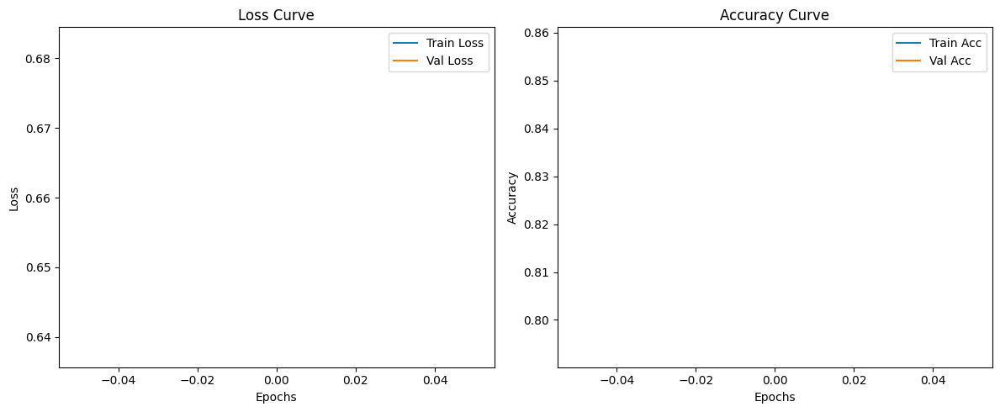

📆 Epoch [2/50] — 🏋️ Train Loss: 0.3579, 📉 Val Loss: 0.8246, 🎯 Train Acc: 0.9045, 🧪 Val Acc: 0.9164
📆 Epoch [3/50] — 🏋️ Train Loss: 0.3108, 📉 Val Loss: 0.2540, 🎯 Train Acc: 0.9141, 🧪 Val Acc: 0.9329
💾 Best model saved!
📆 Epoch [4/50] — 🏋️ Train Loss: 0.2970, 📉 Val Loss: 0.7618, 🎯 Train Acc: 0.9191, 🧪 Val Acc: 0.7436
📆 Epoch [5/50] — 🏋️ Train Loss: 0.2441, 📉 Val Loss: 0.4520, 🎯 Train Acc: 0.9340, 🧪 Val Acc: 0.8681


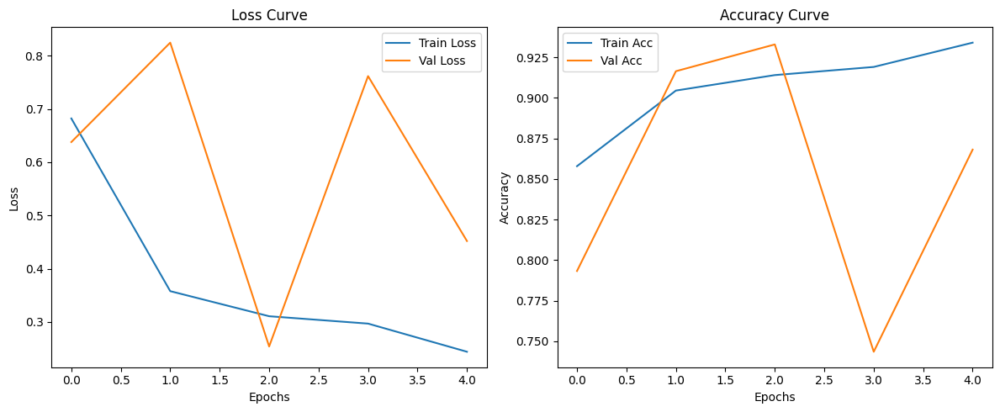

📆 Epoch [6/50] — 🏋️ Train Loss: 0.2721, 📉 Val Loss: 0.3672, 🎯 Train Acc: 0.9271, 🧪 Val Acc: 0.9359
📆 Epoch [7/50] — 🏋️ Train Loss: 0.2440, 📉 Val Loss: 0.3627, 🎯 Train Acc: 0.9346, 🧪 Val Acc: 0.9058
📆 Epoch [8/50] — 🏋️ Train Loss: 0.2130, 📉 Val Loss: 0.2665, 🎯 Train Acc: 0.9446, 🧪 Val Acc: 0.9317
📆 Epoch [9/50] — 🏋️ Train Loss: 0.2058, 📉 Val Loss: 0.2144, 🎯 Train Acc: 0.9446, 🧪 Val Acc: 0.9440
💾 Best model saved!
📆 Epoch [10/50] — 🏋️ Train Loss: 0.1701, 📉 Val Loss: 0.2361, 🎯 Train Acc: 0.9538, 🧪 Val Acc: 0.9332


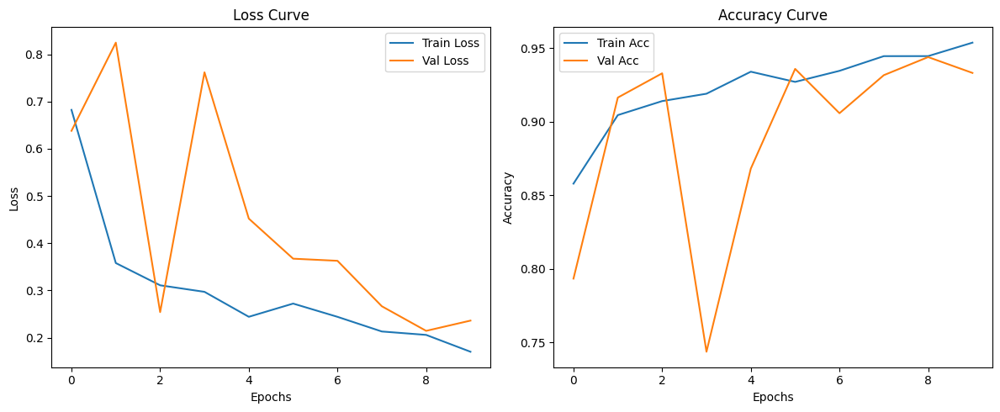

📆 Epoch [11/50] — 🏋️ Train Loss: 0.1588, 📉 Val Loss: 0.3801, 🎯 Train Acc: 0.9585, 🧪 Val Acc: 0.9384
📆 Epoch [12/50] — 🏋️ Train Loss: 0.1580, 📉 Val Loss: 0.2164, 🎯 Train Acc: 0.9574, 🧪 Val Acc: 0.9437
📆 Epoch [13/50] — 🏋️ Train Loss: 0.1305, 📉 Val Loss: 0.1638, 🎯 Train Acc: 0.9652, 🧪 Val Acc: 0.9564
💾 Best model saved!
📆 Epoch [14/50] — 🏋️ Train Loss: 0.1394, 📉 Val Loss: 0.1718, 🎯 Train Acc: 0.9626, 🧪 Val Acc: 0.9552
📆 Epoch [15/50] — 🏋️ Train Loss: 0.1245, 📉 Val Loss: 0.1768, 🎯 Train Acc: 0.9663, 🧪 Val Acc: 0.9566


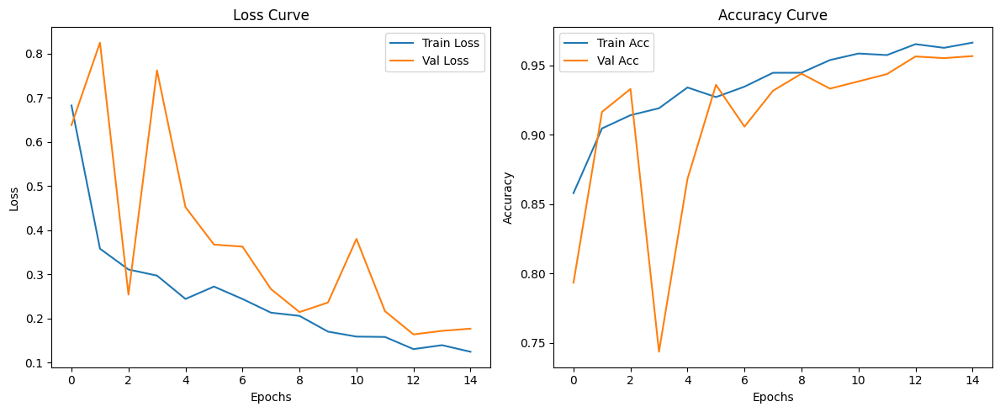

📆 Epoch [16/50] — 🏋️ Train Loss: 0.1083, 📉 Val Loss: 0.2083, 🎯 Train Acc: 0.9710, 🧪 Val Acc: 0.9609
📆 Epoch [17/50] — 🏋️ Train Loss: 0.0997, 📉 Val Loss: 0.1727, 🎯 Train Acc: 0.9732, 🧪 Val Acc: 0.9588
📆 Epoch [18/50] — 🏋️ Train Loss: 0.0997, 📉 Val Loss: 1.2472, 🎯 Train Acc: 0.9733, 🧪 Val Acc: 0.9358
📆 Epoch [19/50] — 🏋️ Train Loss: 0.1206, 📉 Val Loss: 0.1971, 🎯 Train Acc: 0.9677, 🧪 Val Acc: 0.9539
📆 Epoch [20/50] — 🏋️ Train Loss: 0.0890, 📉 Val Loss: 0.1502, 🎯 Train Acc: 0.9760, 🧪 Val Acc: 0.9616
💾 Best model saved!


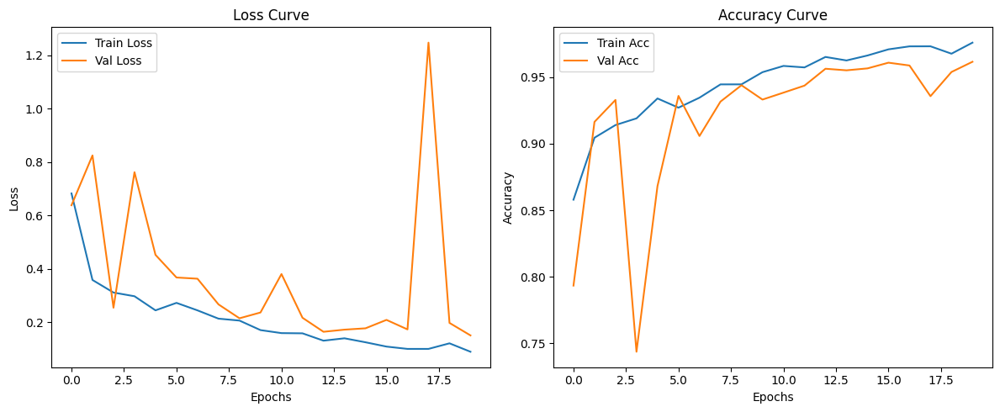

📆 Epoch [21/50] — 🏋️ Train Loss: 0.0814, 📉 Val Loss: 0.1631, 🎯 Train Acc: 0.9781, 🧪 Val Acc: 0.9591
📆 Epoch [22/50] — 🏋️ Train Loss: 0.0770, 📉 Val Loss: 0.1551, 🎯 Train Acc: 0.9793, 🧪 Val Acc: 0.9618
📆 Epoch [23/50] — 🏋️ Train Loss: 0.0741, 📉 Val Loss: 0.1538, 🎯 Train Acc: 0.9799, 🧪 Val Acc: 0.9623
📆 Epoch [24/50] — 🏋️ Train Loss: 0.0732, 📉 Val Loss: 0.1672, 🎯 Train Acc: 0.9800, 🧪 Val Acc: 0.9615
📆 Epoch [25/50] — 🏋️ Train Loss: 0.0687, 📉 Val Loss: 0.1694, 🎯 Train Acc: 0.9812, 🧪 Val Acc: 0.9606


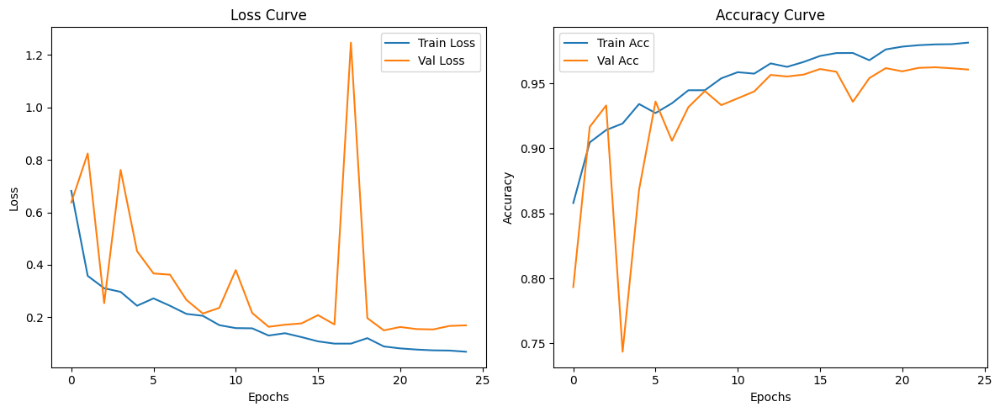

📆 Epoch [26/50] — 🏋️ Train Loss: 0.0665, 📉 Val Loss: 0.1587, 🎯 Train Acc: 0.9818, 🧪 Val Acc: 0.9628
📆 Epoch [27/50] — 🏋️ Train Loss: 0.0635, 📉 Val Loss: 0.1691, 🎯 Train Acc: 0.9826, 🧪 Val Acc: 0.9605
📆 Epoch [28/50] — 🏋️ Train Loss: 0.0609, 📉 Val Loss: 0.1622, 🎯 Train Acc: 0.9833, 🧪 Val Acc: 0.9627
📆 Epoch [29/50] — 🏋️ Train Loss: 0.0598, 📉 Val Loss: 0.1661, 🎯 Train Acc: 0.9835, 🧪 Val Acc: 0.9624
📆 Epoch [30/50] — 🏋️ Train Loss: 0.0602, 📉 Val Loss: 0.1703, 🎯 Train Acc: 0.9834, 🧪 Val Acc: 0.9619


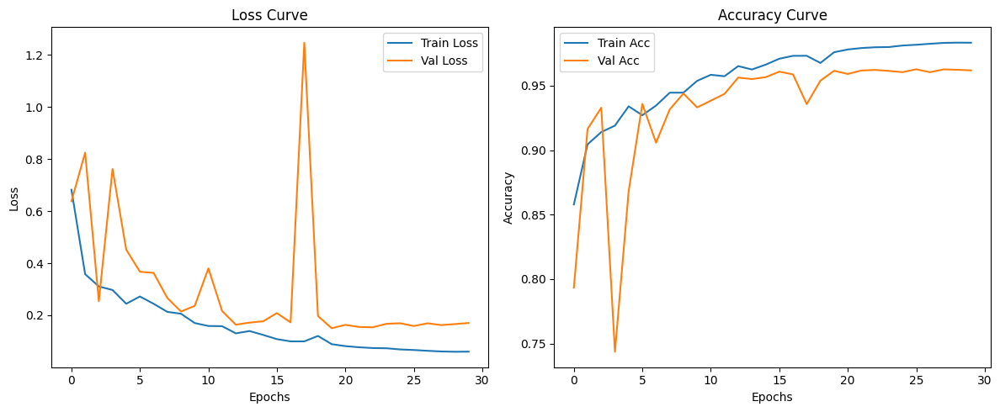

📆 Epoch [31/50] — 🏋️ Train Loss: 0.0574, 📉 Val Loss: 0.1599, 🎯 Train Acc: 0.9841, 🧪 Val Acc: 0.9631
📆 Epoch [32/50] — 🏋️ Train Loss: 0.0565, 📉 Val Loss: 0.1630, 🎯 Train Acc: 0.9844, 🧪 Val Acc: 0.9632
📆 Epoch [33/50] — 🏋️ Train Loss: 0.0549, 📉 Val Loss: 0.1642, 🎯 Train Acc: 0.9847, 🧪 Val Acc: 0.9629
📆 Epoch [34/50] — 🏋️ Train Loss: 0.0546, 📉 Val Loss: 0.1628, 🎯 Train Acc: 0.9848, 🧪 Val Acc: 0.9633
📆 Epoch [35/50] — 🏋️ Train Loss: 0.0535, 📉 Val Loss: 0.1668, 🎯 Train Acc: 0.9851, 🧪 Val Acc: 0.9628


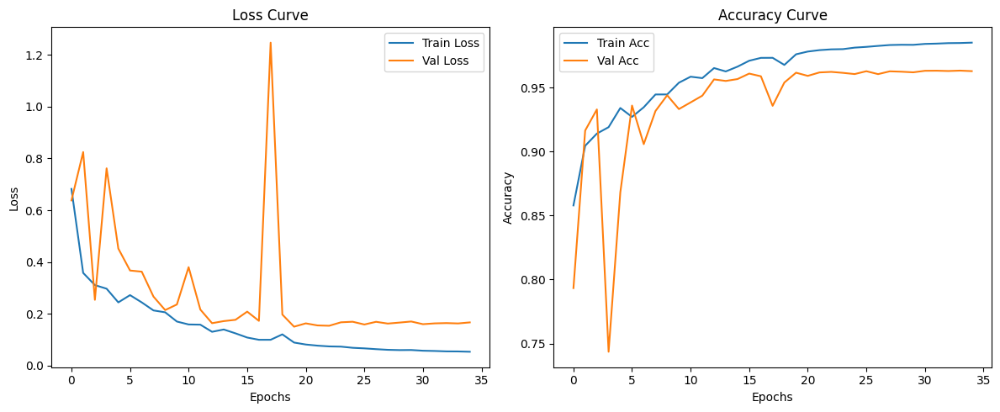

📆 Epoch [36/50] — 🏋️ Train Loss: 0.0527, 📉 Val Loss: 0.1673, 🎯 Train Acc: 0.9853, 🧪 Val Acc: 0.9625
📆 Epoch [37/50] — 🏋️ Train Loss: 0.0527, 📉 Val Loss: 0.1666, 🎯 Train Acc: 0.9853, 🧪 Val Acc: 0.9625
📆 Epoch [38/50] — 🏋️ Train Loss: 0.0525, 📉 Val Loss: 0.1668, 🎯 Train Acc: 0.9854, 🧪 Val Acc: 0.9622
📆 Epoch [39/50] — 🏋️ Train Loss: 0.0517, 📉 Val Loss: 0.1656, 🎯 Train Acc: 0.9855, 🧪 Val Acc: 0.9628
📆 Epoch [40/50] — 🏋️ Train Loss: 0.0522, 📉 Val Loss: 0.1732, 🎯 Train Acc: 0.9854, 🧪 Val Acc: 0.9612


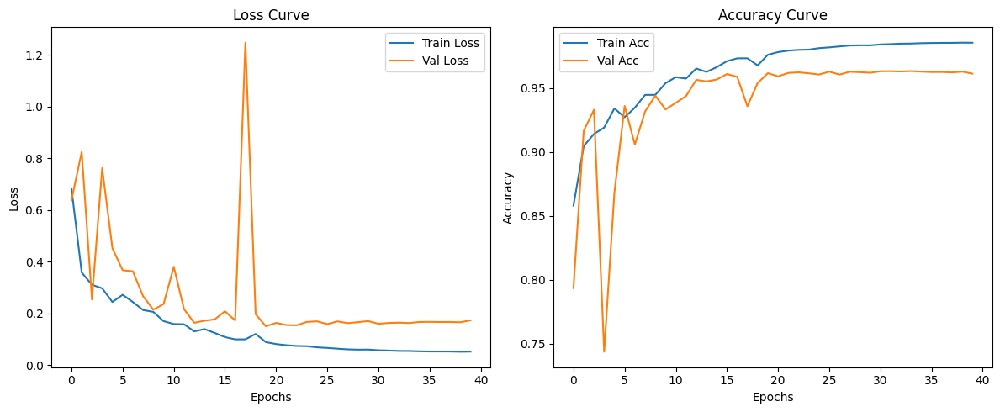

📆 Epoch [41/50] — 🏋️ Train Loss: 0.0510, 📉 Val Loss: 0.1750, 🎯 Train Acc: 0.9857, 🧪 Val Acc: 0.9610
📆 Epoch [42/50] — 🏋️ Train Loss: 0.0505, 📉 Val Loss: 0.1656, 🎯 Train Acc: 0.9859, 🧪 Val Acc: 0.9630
📆 Epoch [43/50] — 🏋️ Train Loss: 0.0502, 📉 Val Loss: 0.1685, 🎯 Train Acc: 0.9859, 🧪 Val Acc: 0.9626
📆 Epoch [44/50] — 🏋️ Train Loss: 0.0503, 📉 Val Loss: 0.1660, 🎯 Train Acc: 0.9859, 🧪 Val Acc: 0.9631
📆 Epoch [45/50] — 🏋️ Train Loss: 0.0500, 📉 Val Loss: 0.1662, 🎯 Train Acc: 0.9860, 🧪 Val Acc: 0.9628


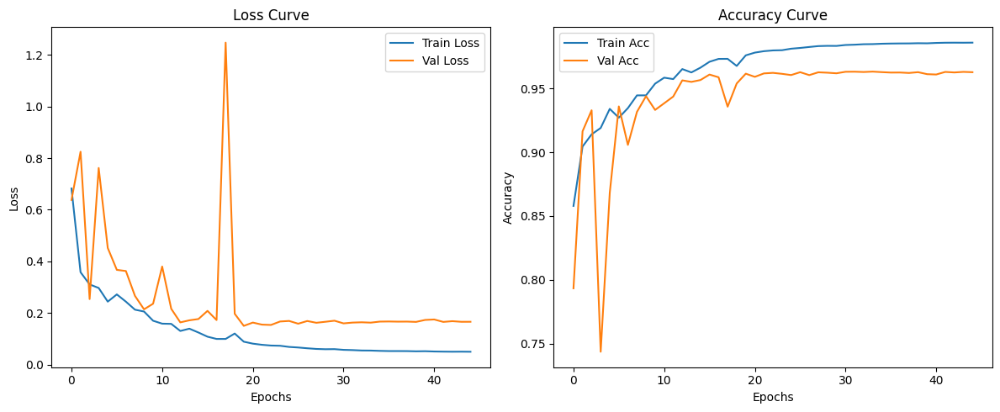

📆 Epoch [46/50] — 🏋️ Train Loss: 0.0498, 📉 Val Loss: 0.1676, 🎯 Train Acc: 0.9860, 🧪 Val Acc: 0.9629
📆 Epoch [47/50] — 🏋️ Train Loss: 0.0504, 📉 Val Loss: 0.1731, 🎯 Train Acc: 0.9859, 🧪 Val Acc: 0.9623
📆 Epoch [48/50] — 🏋️ Train Loss: 0.0496, 📉 Val Loss: 0.1676, 🎯 Train Acc: 0.9861, 🧪 Val Acc: 0.9629
📆 Epoch [49/50] — 🏋️ Train Loss: 0.0494, 📉 Val Loss: 0.1717, 🎯 Train Acc: 0.9861, 🧪 Val Acc: 0.9623
📆 Epoch [50/50] — 🏋️ Train Loss: 0.0495, 📉 Val Loss: 0.1692, 🎯 Train Acc: 0.9861, 🧪 Val Acc: 0.9629


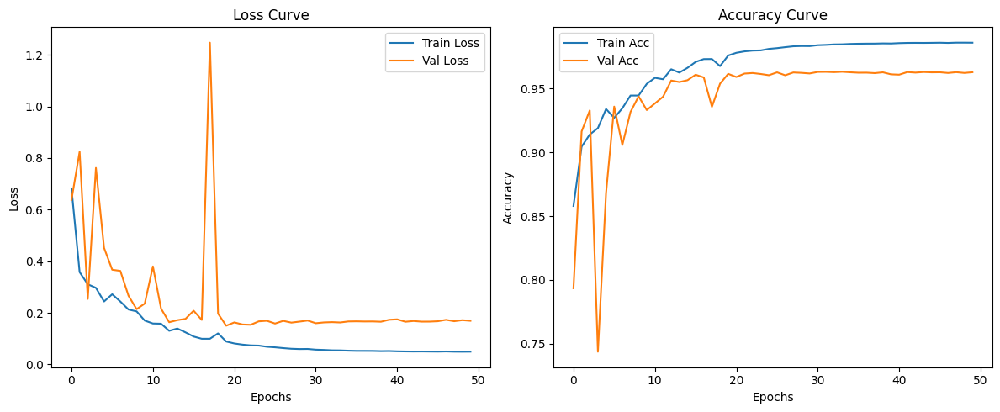

✅ Training complete in 96.06 minutes.


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score
import time

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hybrid Loss: CrossEntropy + Dice Loss
def dice_loss(pred, target, smooth=1.0):
    pred = F.softmax(pred, dim=1)
    pred_flat = pred.argmax(dim=1).contiguous().view(-1)
    target_flat = target.contiguous().view(-1)

    intersection = (pred_flat == target_flat).sum().float()
    union = pred_flat.numel() + target_flat.numel()
    return 1 - ((2. * intersection + smooth) / (union + smooth))

def hybrid_loss(output, target):
    ce = F.cross_entropy(output, target)
    dice = dice_loss(output, target)
    return ce + dice

# Accuracy and F1 Score
def compute_metrics(output, target):
    pred = output.argmax(dim=1).cpu().numpy().flatten()
    target = target.cpu().numpy().flatten()
    accuracy = (pred == target).mean()
    f1 = f1_score(target, pred, average='micro')
    return accuracy, f1

EPOCHS = 50
criterion = hybrid_loss
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=4)

best_val_loss = float('inf')
train_losses = []
val_losses = []
train_accs = []
val_accs = []

start_time = time.time()

for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0
    train_acc = 0.0

    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()

        outputs = model(images)['out']
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        acc, _ = compute_metrics(outputs, masks)
        train_acc += acc

    train_loss /= len(train_loader)
    train_acc /= len(train_loader)
    train_losses.append(train_loss)
    train_accs.append(train_acc)

    model.eval()
    val_loss = 0.0
    val_acc = 0.0

    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)['out']
            loss = criterion(outputs, masks)
            val_loss += loss.item()
            acc, _ = compute_metrics(outputs, masks)
            val_acc += acc

    val_loss /= len(val_loader)
    val_acc /= len(val_loader)
    val_losses.append(val_loss)
    val_accs.append(val_acc)

    scheduler.step(val_loss)

    print(f"📆 Epoch [{epoch+1}/{EPOCHS}] — 🏋️ Train Loss: {train_loss:.4f}, 📉 Val Loss: {val_loss:.4f}, 🎯 Train Acc: {train_acc:.4f}, 🧪 Val Acc: {val_acc:.4f}")


    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_model.pth")
        print("💾 Best model saved!")

    if (epoch + 1) % 5 == 0 or epoch == 0:
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(train_losses, label='Train Loss')
        plt.plot(val_losses, label='Val Loss')
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.legend()
        plt.title("Loss Curve")

        plt.subplot(1, 2, 2)
        plt.plot(train_accs, label='Train Acc')
        plt.plot(val_accs, label='Val Acc')
        plt.xlabel("Epochs")
        plt.ylabel("Accuracy")
        plt.legend()
        plt.title("Accuracy Curve")

        plt.tight_layout()
        plt.show()

end_time = time.time()
print(f"✅ Training complete in {(end_time - start_time)/60:.2f} minutes.")


In [ ]:
  # Load the best saved weights
  model.load_state_dict(torch.load("best_model.pth"))
  model.to(device)
  model.eval()


DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

<ipython-input-11-9047750bbcfe>:53: UserWarning: Glyph 128444 (\N{FRAME WITH PICTURE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-11-9047750bbcfe>:53: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-11-9047750bbcfe>:53: UserWarning: Glyph 128302 (\N{CRYSTAL BALL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128444 (\N{FRAME WITH PICTURE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128302 (\N{CRYSTAL BALL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(b

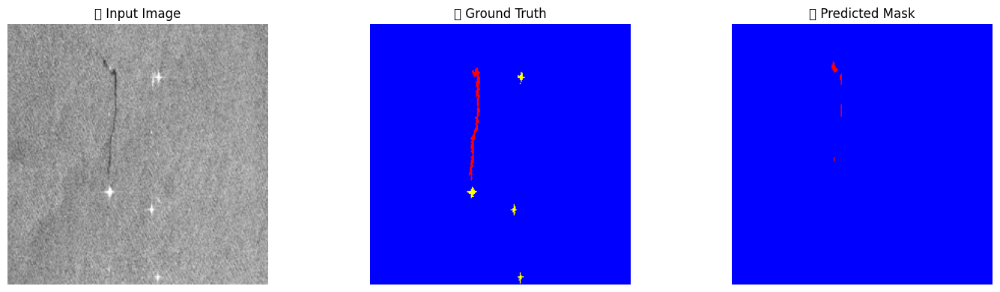

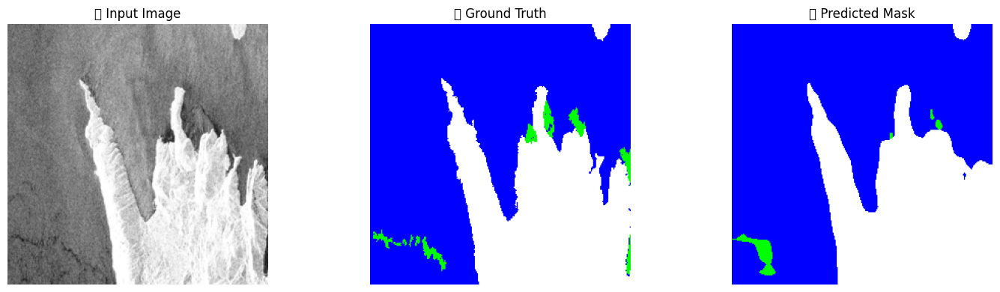

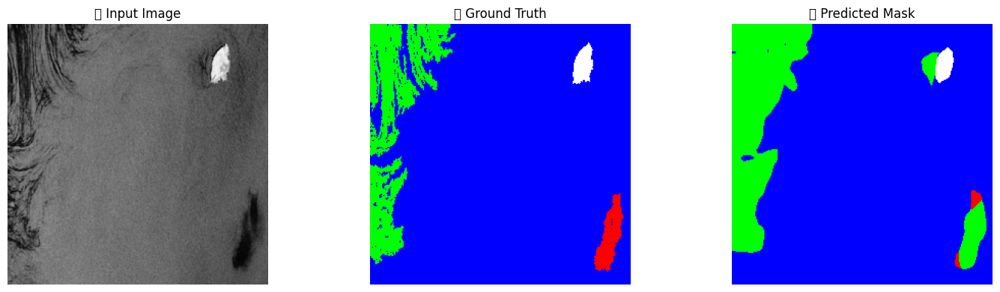

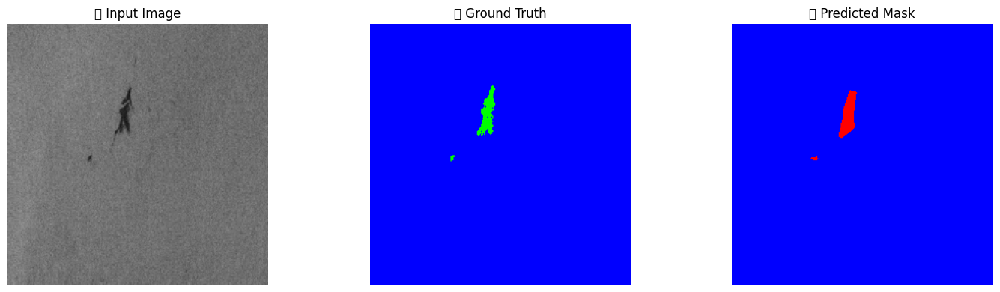

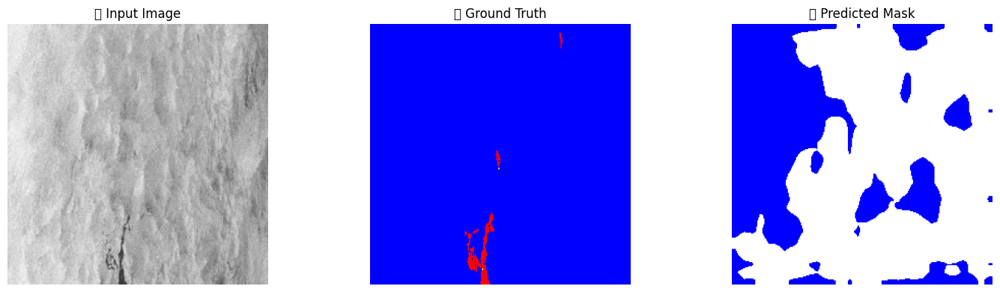

...

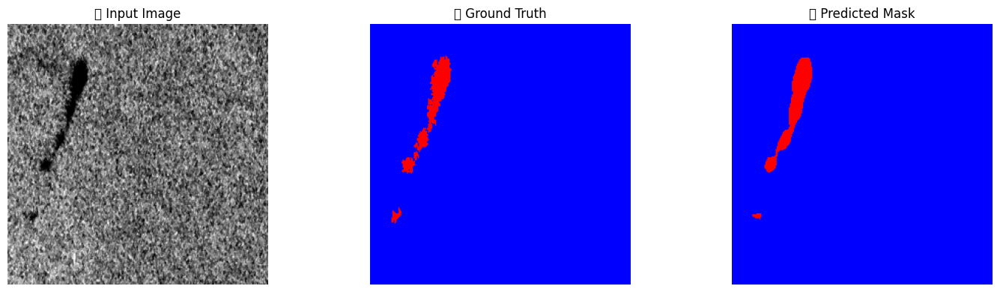

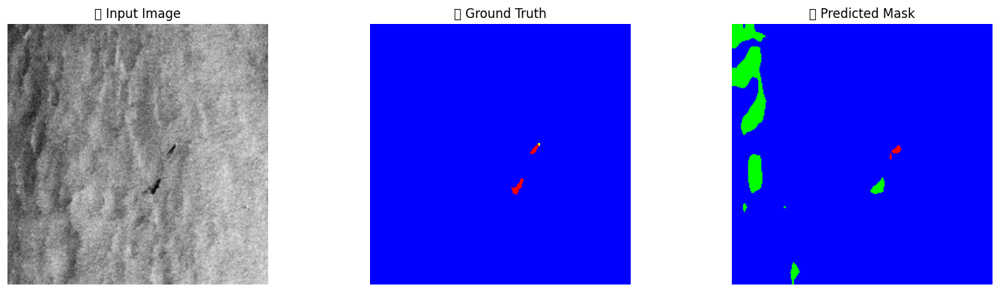

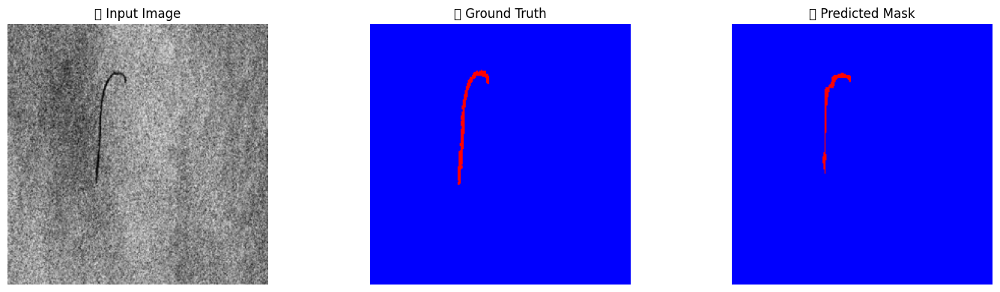

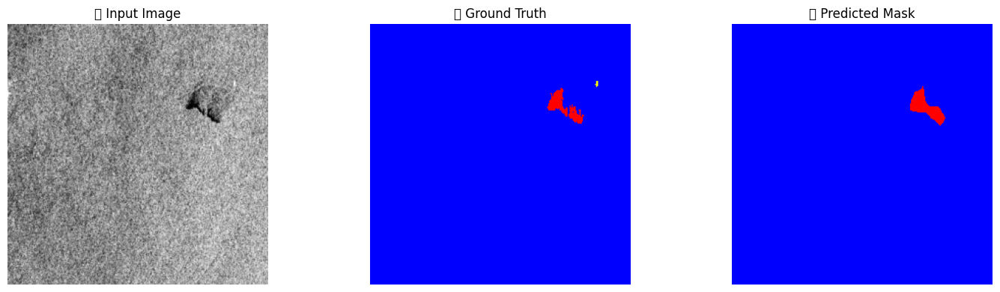

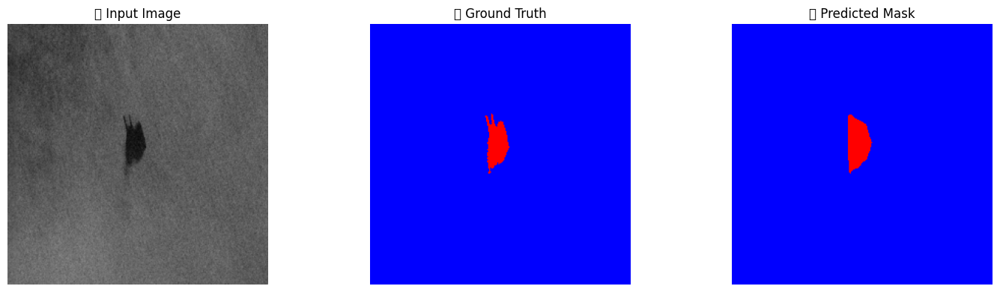

In [ ]:
import matplotlib.pyplot as plt

def decode_segmap(mask, colormap):
    rgb = colormap[mask]
    return rgb

# color palette: 0–4 → sea, oil, lookalike, ship, land
colormap = np.array([
    [0, 0, 255],      # 0: Sea Surface → Blue
    [255, 0, 0],      # 1: Oil Spill → Red
    [0, 255, 0],      # 2: Look-alike → Green
    [255, 255, 0],    # 3: Ship → Yellow
    [255, 255, 255],  # 4: Land → White
], dtype=np.uint8)

num_samples = 5
model.eval()

with torch.no_grad():
    for i, (images, masks) in enumerate(test_loader):
        if i >= num_samples:
            break

        images, masks = images.to(device), masks.to(device)
        outputs = model(images)['out']
        preds = torch.argmax(outputs, dim=1).cpu().numpy()
        images = images.cpu().numpy()
        masks = masks.cpu().numpy()

        for j in range(images.shape[0]):
            image_np = np.transpose(images[j], (1, 2, 0))
            gt_mask = decode_segmap(masks[j], colormap)
            pred_mask = decode_segmap(preds[j], colormap)

            plt.figure(figsize=(15, 4))
            plt.subplot(1, 3, 1)
            plt.imshow(image_np)
            plt.title("🖼️ Input Image")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(gt_mask)
            plt.title("✅ Ground Truth")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(pred_mask)
            plt.title("🔮 Predicted Mask")
            plt.axis("off")

            plt.tight_layout()
            plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, f1_score

# Evaluation function
def evaluate_model(model, dataloader):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)['out']
            preds = torch.argmax(outputs, dim=1)

            all_preds.append(preds.view(-1).cpu())
            all_labels.append(masks.view(-1).cpu())

    all_preds = torch.cat(all_preds).numpy()
    all_labels = torch.cat(all_labels).numpy()

    acc = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='macro')

    print(f"📈 Test Accuracy: {acc:.4f}")
    print(f"📊 Test F1-Score (macro): {f1:.4f}")

evaluate_model(model, test_loader)


📈 Test Accuracy: 0.9568
📊 Test F1-Score (macro): 0.6316


📈 Accuracy: 0.9568
📊 F1 Score (Macro): 0.6316
📌 Mean IoU: 0.5413
🧪 Mean Dice Score: 0.6316
🔍 IoU per class:
  - Class 0: 0.9558
  - Class 1: 0.4195
  - Class 2: 0.5644
  - Class 3: 0.0000
  - Class 4: 0.7670
🔍 Dice per class:
  - Class 0: 0.9774
  - Class 1: 0.5910
  - Class 2: 0.7215
  - Class 3: 0.0000
  - Class 4: 0.8681

🔍 Sample Predictions:


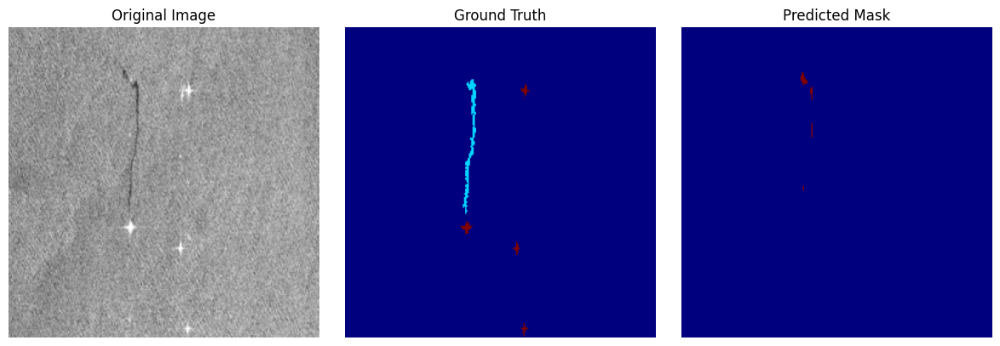

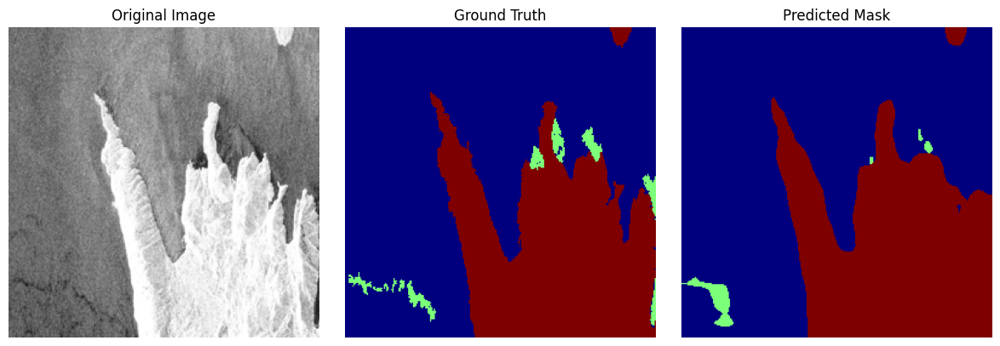

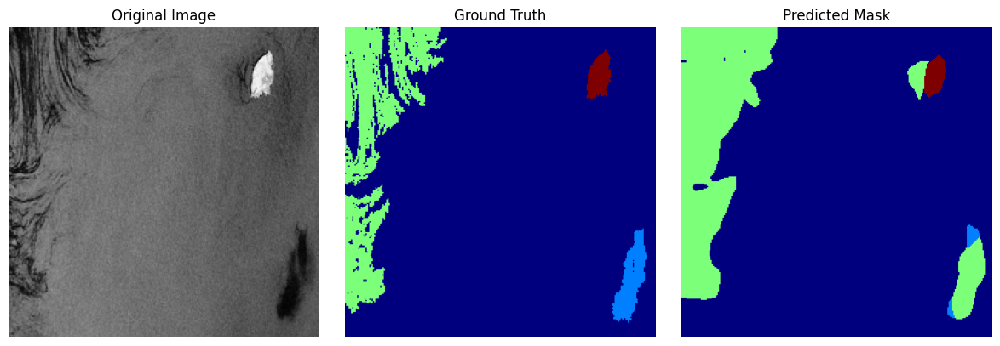

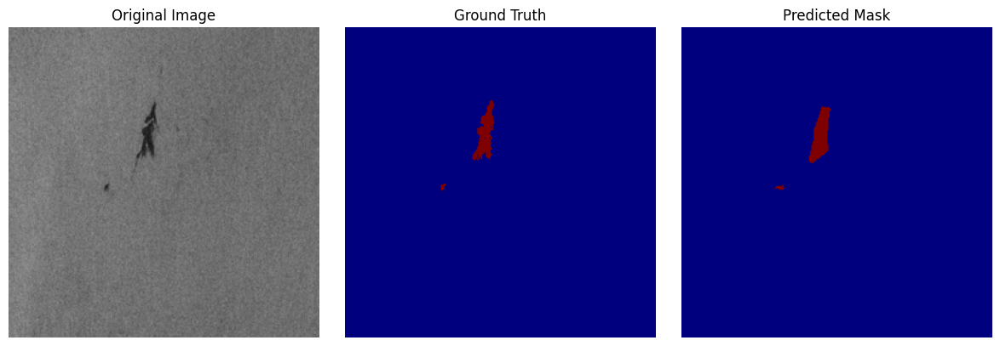

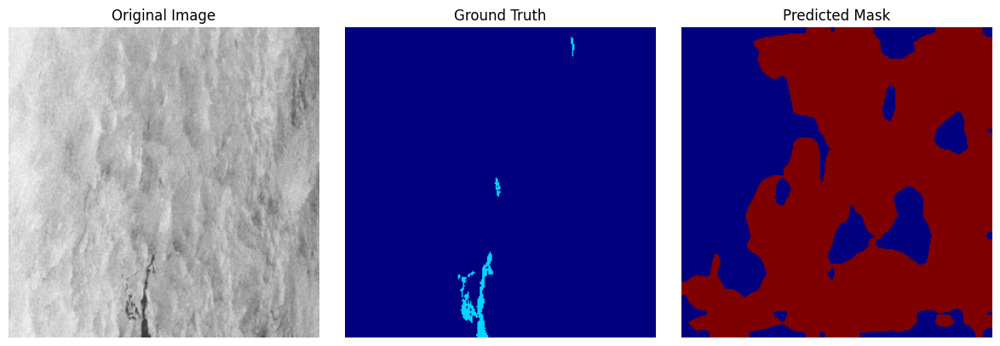

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
import torch.nn.functional as F

def compute_metrics(preds, labels, num_classes=5):
    conf_matrix = confusion_matrix(labels, preds, labels=list(range(num_classes)))
    intersection = np.diag(conf_matrix)
    union = conf_matrix.sum(axis=1) + conf_matrix.sum(axis=0) - np.diag(conf_matrix)
    iou_per_class = intersection / np.maximum(union, 1)
    mean_iou = np.mean(iou_per_class)

    dice_scores = 2 * intersection / np.maximum((conf_matrix.sum(axis=1) + conf_matrix.sum(axis=0)), 1)
    mean_dice = np.mean(dice_scores)

    return iou_per_class, mean_iou, dice_scores, mean_dice

def evaluate_and_visualize(model, dataloader, num_classes=5, num_samples=5):
    model.eval()
    all_preds, all_labels = [], []
    vis_images, vis_preds, vis_masks = [], [], []
    count = 0

    with torch.no_grad():
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)['out']
            preds = torch.argmax(outputs, dim=1)

            all_preds.append(preds.view(-1).cpu())
            all_labels.append(masks.view(-1).cpu())

            if count < num_samples:
                vis_images.extend(images.cpu())
                vis_preds.extend(preds.cpu())
                vis_masks.extend(masks.cpu())
                count += images.size(0)

    # Flatten for metrics
    all_preds_flat = torch.cat(all_preds).numpy()
    all_labels_flat = torch.cat(all_labels).numpy()

    acc = accuracy_score(all_labels_flat, all_preds_flat)
    f1 = f1_score(all_labels_flat, all_preds_flat, average='macro')
    iou_per_class, mean_iou, dice_scores, mean_dice = compute_metrics(all_preds_flat, all_labels_flat)

    print(f"📈 Accuracy: {acc:.4f}")
    print(f"📊 F1 Score (Macro): {f1:.4f}")
    print(f"📌 Mean IoU: {mean_iou:.4f}")
    print(f"🧪 Mean Dice Score: {mean_dice:.4f}")
    print("🔍 IoU per class:")
    for i, iou in enumerate(iou_per_class):
        print(f"  - Class {i}: {iou:.4f}")
    print("🔍 Dice per class:")
    for i, dice in enumerate(dice_scores):
        print(f"  - Class {i}: {dice:.4f}")

    # 🎨 Visualization
    print("\n🔍 Sample Predictions:")
    for i in range(min(num_samples, len(vis_images))):
        fig, axs = plt.subplots(1, 3, figsize=(12, 4))
        axs[0].imshow(vis_images[i].permute(1, 2, 0))
        axs[0].set_title("Original Image")
        axs[1].imshow(vis_masks[i], cmap="jet")
        axs[1].set_title("Ground Truth")
        axs[2].imshow(vis_preds[i], cmap="jet")
        axs[2].set_title("Predicted Mask")
        for ax in axs:
            ax.axis("off")
        plt.tight_layout()
        plt.show()

# 🚀 Run it
evaluate_and_visualize(model, test_loader)


In [ ]:
# Save model
model_path = "best_oilspill_model.pt"
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")


Model saved to best_oilspill_model.pt


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as T
import torch

def predict_new_image(image_path, model):
    print(f"🔍 Loading image from: {image_path}")

    try:
        model.eval()
        image = Image.open(image_path).convert("RGB")
        transform = T.Compose([
            T.Resize((256, 256)),
            T.ToTensor()
        ])
        input_tensor = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(input_tensor)['out']
            pred_mask = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

        # Visualize image and prediction
        plt.figure(figsize=(10, 4))

        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title("Input Image")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(pred_mask, cmap='jet')
        plt.title("Predicted Mask")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"❌ Error: {e}")

In [ ]:
torch.save(model.state_dict(), "oilspill_best_model.pth")


In [ ]:
from google.colab import files
files.download("oilspill_best_model.pth")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import os
import cv2

output_dir = "/content/oilspill_predictions"
os.makedirs(output_dir, exist_ok=True)

def save_prediction(image_path, model, output_folder):
    image = Image.open(image_path).convert("RGB")
    transform = T.Compose([
        T.Resize((256, 256)),
        T.ToTensor()
    ])
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)['out']
        pred_mask = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

    # Convert prediction to RGB heatmap
    colormap = plt.get_cmap('jet')
    colored_mask = colormap(pred_mask / pred_mask.max())  # Normalize and color
    colored_mask = (colored_mask[:, :, :3] * 255).astype("uint8")  # Drop alpha and scale

    image_name = os.path.basename(image_path).split('.')[0]
    save_path = os.path.join(output_folder, f"{image_name}_prediction.png")
    cv2.imwrite(save_path, cv2.cvtColor(colored_mask, cv2.COLOR_RGB2BGR))

    print(f"✅ Saved prediction: {save_path}")


In [ ]:
model.load_state_dict(torch.load("oilspill_best_model.pth"))
model.eval()

DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

<ipython-input-51-d77cbfbaa539>:42: UserWarning: Glyph 128738 (\N{OIL DRUM}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-51-d77cbfbaa539>:43: UserWarning: Glyph 128738 (\N{OIL DRUM}) missing from font(s) DejaVu Sans.
  plt.savefig("final_visualization.png")
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128738 (\N{OIL DRUM}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


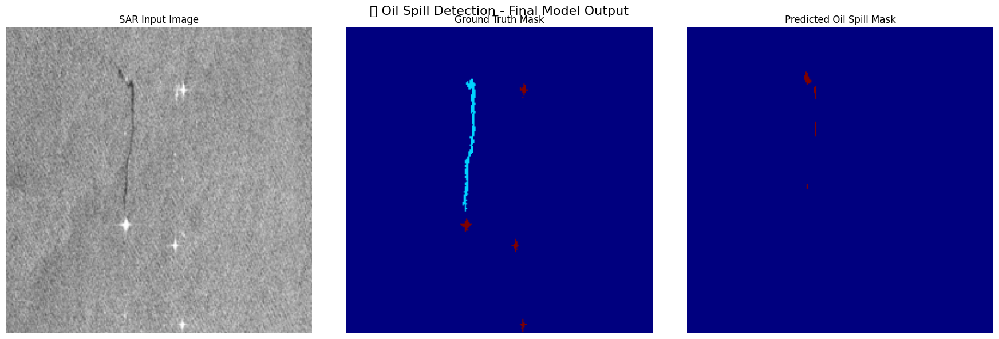

In [ ]:
import matplotlib.pyplot as plt
import cv2
import torch

# Select one sample from test dataset
sample_image, sample_mask = next(iter(test_loader))
sample_image = sample_image[0].to(device)  # Unbatch the image
sample_mask = sample_mask[0]  # Unbatch the mask

# Get model prediction
model.eval()
with torch.no_grad():
    output = model(sample_image.unsqueeze(0))['out']  # Add batch dimension back
    prediction = torch.argmax(output, dim=1).squeeze().cpu().numpy()

# Convert input tensor to image
image_np = sample_image.cpu().permute(1, 2, 0).numpy()
image_np = (image_np * 255).astype("uint8")

# Ground truth mask
mask_np = sample_mask.cpu().numpy()

# Plotting
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(image_np)
plt.title("SAR Input Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mask_np, cmap="jet")
plt.title("Ground Truth Mask")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(prediction, cmap="jet")
plt.title("Predicted Oil Spill Mask")
plt.axis("off")

plt.suptitle("🛢️ Oil Spill Detection - Final Model Output", fontsize=16)
plt.tight_layout()
plt.savefig("final_visualization.png")
plt.show()


<ipython-input-52-47e58b51ee0d>:47: UserWarning: Glyph 128738 (\N{OIL DRUM}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-52-47e58b51ee0d>:48: UserWarning: Glyph 128738 (\N{OIL DRUM}) missing from font(s) DejaVu Sans.
  plt.savefig(f"oilspill_result_{count+1}.png")


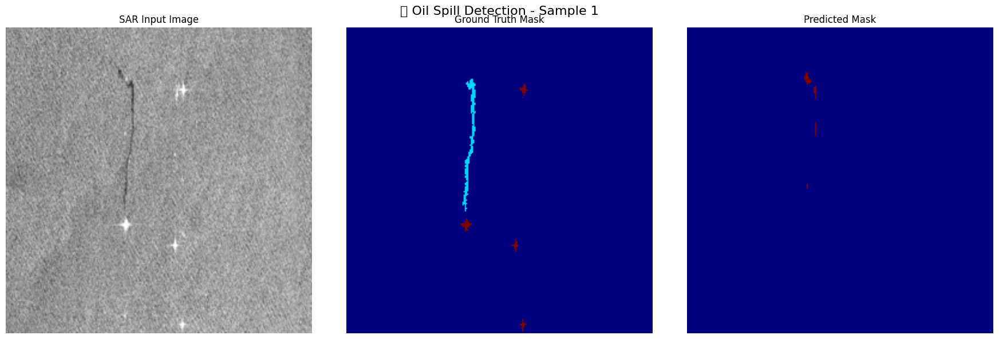

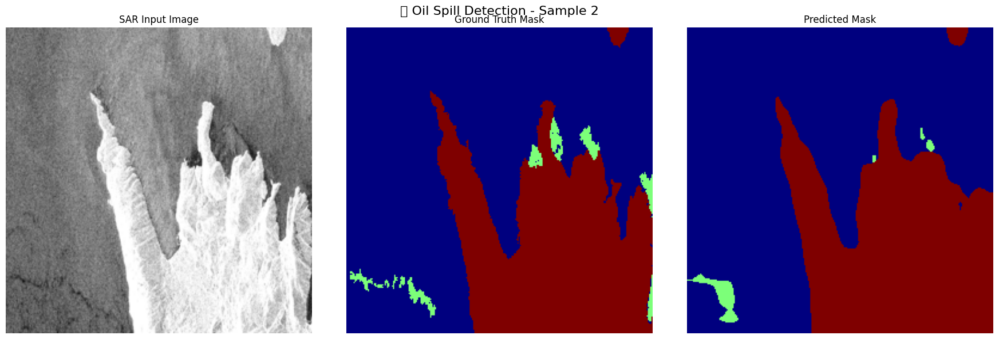

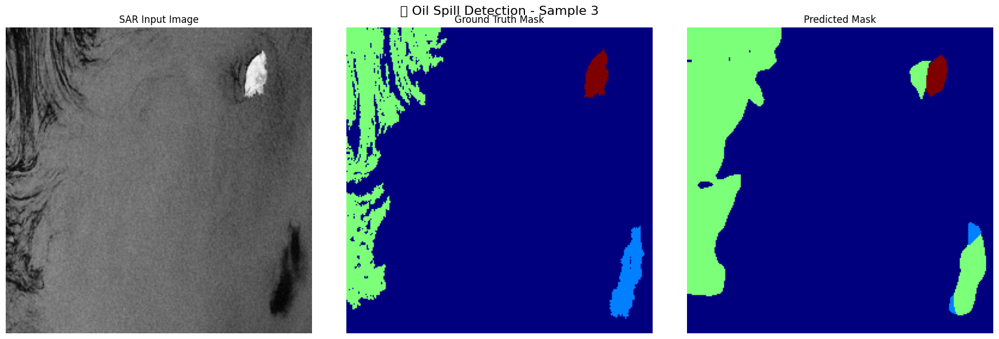

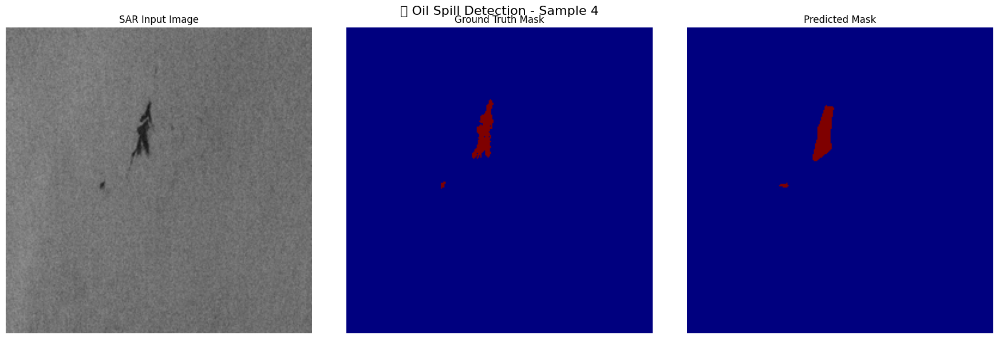

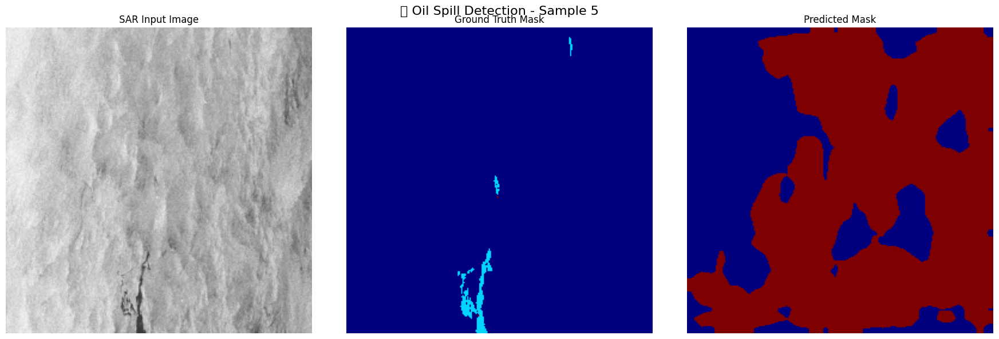

In [ ]:
import matplotlib.pyplot as plt
import torch

# Number of images to visualize
num_samples = 5

# Set model to eval mode
model.eval()

# Iterate through test_loader and visualize N predictions
count = 0
for sample_image_batch, sample_mask_batch in test_loader:
    for i in range(sample_image_batch.size(0)):
        if count >= num_samples:
            break

        sample_image = sample_image_batch[i].to(device)
        sample_mask = sample_mask_batch[i]

        with torch.no_grad():
            output = model(sample_image.unsqueeze(0))['out']
            prediction = torch.argmax(output, dim=1).squeeze().cpu().numpy()

        image_np = sample_image.cpu().permute(1, 2, 0).numpy()
        image_np = (image_np * 255).astype("uint8")
        mask_np = sample_mask.cpu().numpy()

        # Plot
        plt.figure(figsize=(18, 6))

        plt.subplot(1, 3, 1)
        plt.imshow(image_np)
        plt.title("SAR Input Image")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(mask_np, cmap="jet")
        plt.title("Ground Truth Mask")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(prediction, cmap="jet")
        plt.title("Predicted Mask")
        plt.axis("off")

        plt.suptitle(f"🛢️ Oil Spill Detection - Sample {count + 1}", fontsize=16)
        plt.tight_layout()
        plt.savefig(f"oilspill_result_{count+1}.png")
        plt.show()

        count += 1
    if count >= num_samples:
        break
